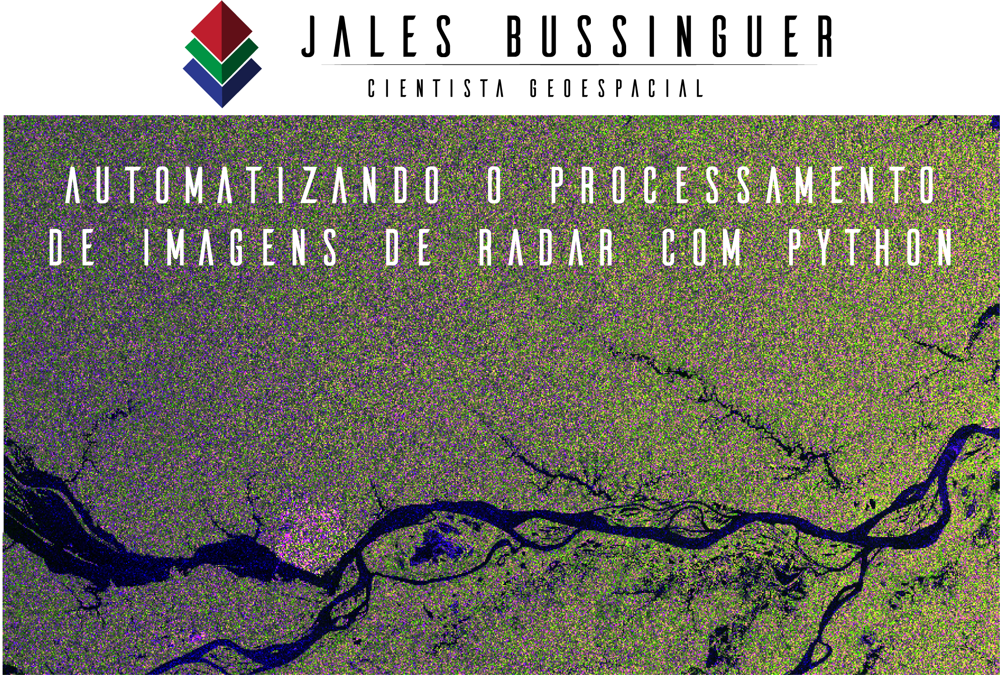

## Contexto:

A ideia desse estudo tem origem no meu projeto final de graduação do curso de Engenharia Ambiental na Universidade de Brasília, desenvolvido em 2019.

Em resumo, nesse projeto eu precisava processar imagens da constelação Sentinel-1 (ESA), radar de abertura sintética (SAR), para extrair extensões de rios que serviriam para calibrar um modelo hidráulico de rios amazônicos.

Devido à minha inexperiência no assunto, perdia muito tempo fazendo todos os processamentos manualmente, um por um, no software SNAP (SeNtinel Application Program). Além disso, ocorriam muitos erros de processamento, o que tornava o processo ainda mais demorado e estressante.

Em meados de maio de 2020 decidi intensificar os estudos de programação em Python, onde um dos objetivos era aprender a automatizar processos por meio de scripts, tendo esse problema como principal motivação.

## Objetivos do projeto

### Objetivo geral: 

Processar parte de uma cena do Sentinel-1 de forma automatizada por meio de algoritmos instanciados em um script na linguagem Python.

### Objetivos específicos: 

1. Aprender a utilizar os módulos do snappy; 
2. Praticar a programação em Python;
3. Consolidar os conhecimentos de processamento de imagens SAR.

## Local de estudo:

Região da confluência entre os rios Negro e Solimões, nas proximidades de Manaus (AM).

## Dados:

Nesse estudo será utilizada uma imagem do satélite Sentinel-1A, obtida em formato .zip por meio da Copernicus Open Access Hub. [link]

A imagem possui as seguintes especificações:

- Identificação: S1A_IW_GRDH_1SDV_20181220T093910_20181220T093935_025107_02C588_9290;
- Data: 20/12/2018;
- Tipo de produto: Level 1 - GRD;
- Modo de aquisição: IW;
- Número de órbita: 25107;
- Polarizações: VH, VV;
- Pixels: 10 x 10 m.

## Aplicabilidade:
 
O script apresentado a seguir foi pensado para atender uma demanda específica de um projeto. Contudo, os processamentos envolvidos nessa prática são algoritmos de pré-processamento, ou seja, tem a finalidade de aprimorar as características geométricas e radiométricas das imagens para uma melhor diferenciação entre as feições que compõem a cena.

As imagens, após serem processadas, podem ser utilizadas para estudos de mapeamento de cheias, estudos de umidade do solo, classificação (supervisionada e não supervisionada), etc.

## Índice:

- 1. Importação das bibliotecas;
- 2. Função de plotagem da imagem;
- 3. Importação da imagem;
- 4. Processamentos
    - 4.1. Correção do arquivo de vetores de órbita
    - 4.2. Recorte da imagem
    - 4.3. Calibração Radiométrica
    - 4.4. Filtragem de ruído speckle
    - 4.5. Correção Geométrica
    - 4.6. Conversão para escala em decibéis (dB)
- 5. Salvando a imagem
- 6. Conclusões

## 1. Importação das bibliotecas

In [1]:
# Módulos do snappy

from snappy import ProductIO # Módulo de input e output de arquivos (leitura e escrita)
from snappy import jpy # biblioteca que faz a ponte entre o Python e a API em Java
from snappy import GPF # Graph Processing Framework, utilizado para "chamar" os operadores
from snappy import HashMap # Java Hashmap, objeto equivalente a um dicionário do Python
from snappy import WKTReader # Módulo para a criação de geometrias no formato Well-Known-Text (WKT)
from snappy import ProductUtils # Módulo auxiliar para acessar os metadados dos produtos

# Bibliotecas básicas
import numpy as np
import matplotlib.pyplot as plt

# Reutilização de memória RAM (Garbage Collector)
System = jpy.get_type('java.lang.System')
System.gc()

print('Bibliotecas importadas com sucesso!')

Bibliotecas importadas com sucesso!


## 2. Função de plotagem da imagem

O algoritmo de plotagem da imagem tem os seguintes passos:

1. Fazer a leitura da largura e altura em número de pixels da imagem;
2. Criar uma matriz de zeros de dimensões largura * altura;
3. Popular a matriz de zeros com os valores dos pixels;
4. Formatar a imagem para ser apresentada na horizontal;
5. Utilizar a matriz com os valores dos pixels para plotar a imagem em níveis de cinza

In [2]:
def plotBand(data, banda, vmin, vmax):
    
    '''
    data = Arquivo da imagem; 
    banda = banda utilizada; 
    vmin = Valor mínimo de nível de cinza; 
    vmax = Valor máximo de nível de cinza.
    
    '''
    
    band = data.getBand(banda) # banda selecionada
    width = band.getRasterWidth() # largura da imagem em pixels
    height = band.getRasterHeight() # Altura da imagem em pixels
    
    band_data = np.zeros(width * height, np.float32) # matriz de zeros a ser populada com os valores dos pixels
    
    band.readPixels(0, 0, width, height, band_data) # leitura dos pixels da imagem e registo na matriz de zeros

    band_data.shape = height, width  # Formatação dos dados da imagem

    plt.figure(figsize=(15, 15)) # Tamanho do gráfico
    
    imgplot = plt.imshow(band_data, cmap=plt.cm.binary, vmin=vmin, vmax=vmax) # Plotagem da imagem com o matplotlib

    return imgplot

## 3. Importação da imagem

In [3]:
s1_file = 'S1A_IW_GRDH_1SDV_20181220T093910_20181220T093935_025107_02C588_9290'

product = ProductIO.readProduct('C:/Users/jales/Desktop/%s.zip' % (s1_file))

width = product.getSceneRasterWidth()
height = product.getSceneRasterHeight()
name = product.getName()
band_names = product.getBandNames()

print(f'Produto: {name}')
print(f'Dimensões da cena: {width} x {height} pixels')
print(f'Bandas: {list(band_names)}')

Produto: S1A_IW_GRDH_1SDV_20181220T093910_20181220T093935_025107_02C588_9290
Dimensões da cena: 25581 x 16847 pixels
Bandas: ['Amplitude_VH', 'Intensity_VH', 'Amplitude_VV', 'Intensity_VV']


Nesse projeto vamos utilizar a banda Intensity_VH, que contém a intensidade do sinal que chega ao sensor no canal VH. A imagem carregada tem o seguinte aspecto:

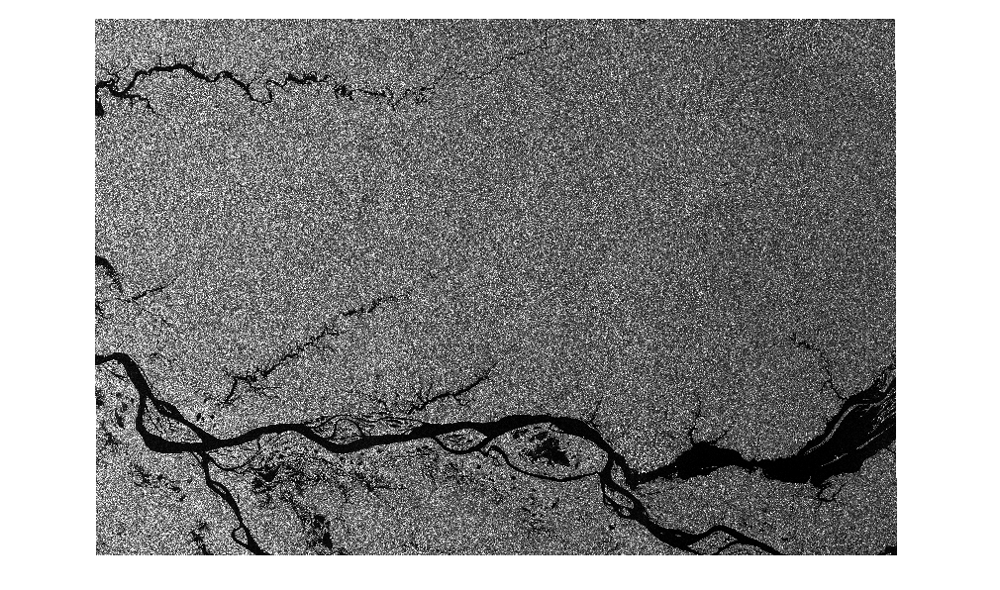

Uma coisa que chama a atenção é o fato da imagem estar invertida. Essa inversão se deve ao modo como as imagens são adquiridas por um satélite em órbita descendente.

## 4. Processamentos:

Para realizar os processamentos é necessário "chamar" o operador, estabelecer os parâmetros e indicar qual o alvo do processamento.

A rotina será executada na seguinte ordem:
1. Correção do arquivo de vetores orbitais;
2. Primeiro recorte da imagem;
3. Calibração radiométrica;
4. Filtragem de ruído speckle;
5. Correção geométrica;
6. Conversão para uma escala em decibéis.

### 4.1. Correção do arquivo de vetores orbitais da imagem

In [4]:
parameters = HashMap()

GPF.getDefaultInstance().getOperatorSpiRegistry().loadOperatorSpis()

parameters.put('orbitType', 'Sentinel Precise (Auto Download)')
parameters.put('polyDegree', '3')
parameters.put('continueOnFail', 'false')

S1A_Orb = GPF.createProduct('Apply-Orbit-File', parameters, product)

print('Correção do arquivo de vetores orbitais da imagem: 100%')

Correção do arquivo de vetores orbitais da imagem: 100%


### 4.2. Recorte da imagem

O recorte da imagem tem o intuito de diminuir o volume de dados a serem processados e o tempo de processamento.

O polígono destacado em rosa será utilizado para delimitar a área de recorte.

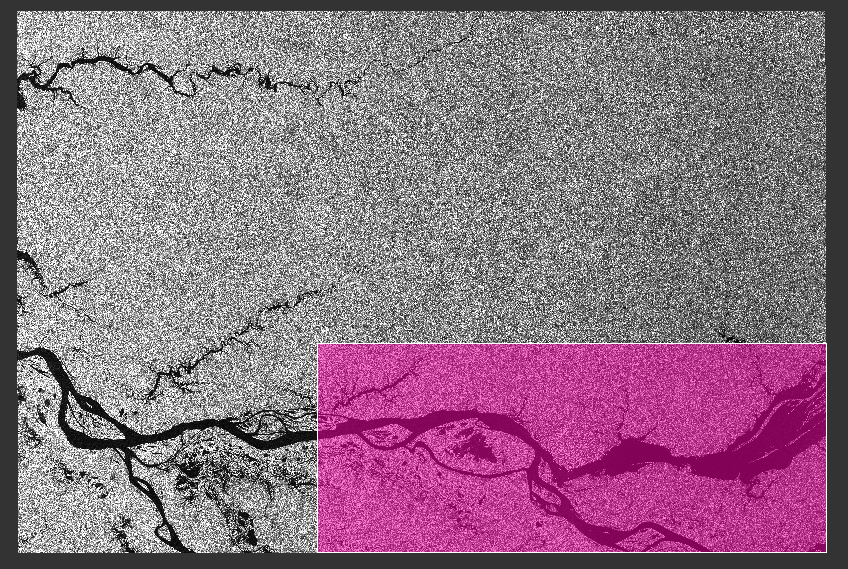

As coordenadas do polígono forma extraídas diretamente do SNAP.

In [5]:
# Polígono de recorte
wkt = 'POLYGON ((-59.22754474309982 -2.9590638169211387, -60.61705371007052 -2.654202114932729, -60.74199571203257 -3.235267731124794, -59.352005984735705 -3.541379678642036, -59.22754474309982 -2.9590638169211387))'

geometria = WKTReader().read(wkt)

HashMap = jpy.get_type('java.util.HashMap')
GPF.getDefaultInstance().getOperatorSpiRegistry().loadOperatorSpis()

parameters = HashMap()
parameters.put('geoRegion', geometria)
parameters.put('copyMetadata', True)

S1A_Orb_Sub = GPF.createProduct('Subset', parameters, S1A_Orb)

print('Recorte da imagem: 100%')

Recorte da imagem: 100%


In [6]:
# Informações do produto do processamento

band = S1A_Orb_Sub.getBand('Intensity_VH')

width = band.getRasterWidth()
height = band.getRasterHeight()
name = band.getName()

print(f'Product: {name}')
print(f'Shape: {width} x {height} pixels')
print(f'Bands: {list(band_names)}')

Product: Intensity_VH
Shape: 15815 x 6498 pixels
Bands: ['Amplitude_VH', 'Intensity_VH', 'Amplitude_VV', 'Intensity_VV']


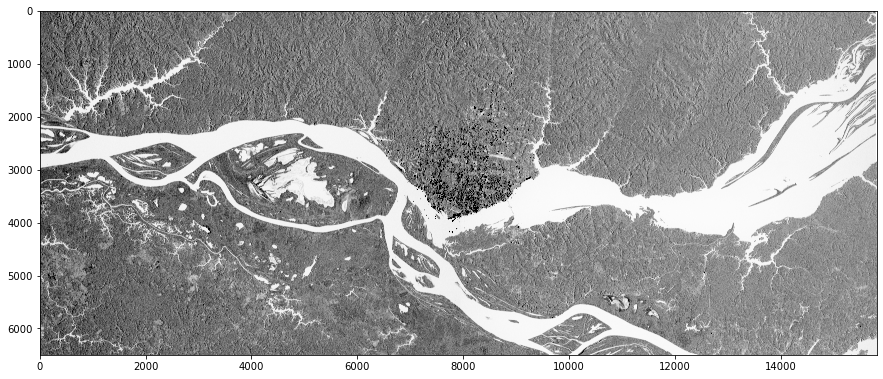

In [7]:
plotBand(S1A_Orb_Sub, 'Intensity_VH', 0, 30000)

### 4.3. Calibração Radiométrica

Esse processamento é feito para que os números digitais dos pixels da imagem sejam diretamente relacionados ao nível de retroespalhamento da superfície medido pelo sensor e é essencial para a comparação de imagens adquiridas por um mesmo sensor em diferentes épocas e/ou em diferentes modos.

In [8]:
HashMap = jpy.get_type('java.util.HashMap')
GPF.getDefaultInstance().getOperatorSpiRegistry().loadOperatorSpis()

parameters = HashMap()
parameters.put('outputSigmaBand', True)
parameters.put('sourceBands', 'Intensity_VH')
parameters.put('selectedPolarisations', 'VH')
parameters.put('outputImageScaleInDb', False)

S1A_Orb_Sub_Cal = GPF.createProduct('Calibration', parameters, S1A_Orb_Sub)

print('Calibração radiométrica: 100%')

Calibração radiométrica: 100%


In [9]:
# Informações do produto do processamento

band = S1A_Orb_Sub_Cal.getBand('Sigma0_VH')

width = band.getRasterWidth()
height = band.getRasterHeight()
name = band.getName()

print(f'Product: {name}')
print(f'Shape: {width} x {height} pixels')
print(f'Bands: {list(band_names)}')

Product: Sigma0_VH
Shape: 15815 x 6498 pixels
Bands: ['Amplitude_VH', 'Intensity_VH', 'Amplitude_VV', 'Intensity_VV']


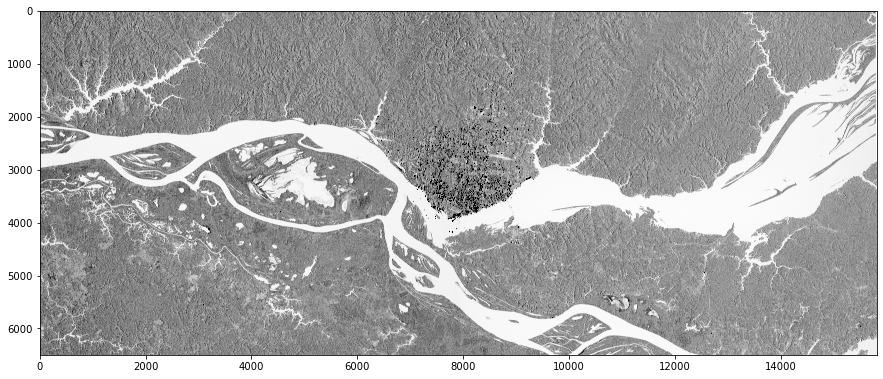

In [10]:
plotBand(S1A_Orb_Sub_Cal, 'Sigma0_VH', 0, 0.1)

### 4.4. Filtragem de ruído speckle

Esse processamento é feito pois imagens SAR apresentam uma textura característica similar a uma mistura de sal e pimenta causada por interferências construtivas e destrutivas no sinal que retorna ao sensor. O ruído speckle  degrada a qualidade da imagem e dificulta a interpretação das feições da cena. 

Neste estudo vamos utilziar o filtro de Lee com um kernel de 3x3.

In [11]:
parameters = HashMap()

parameters.put('sourceBands', 'Sigma0_VH')
parameters.put('filter', 'Lee')
parameters.put('filterSizeX', '3')
parameters.put('filterSizeY', '3')
parameters.put('dampingFactor', '2')
parameters.put('estimateENL', 'true')
parameters.put('enl', '1.0')
parameters.put('numLooksStr', '1')
parameters.put('targetWindowSizeStr', '3x3')
parameters.put('sigmaStr', '0.9')
parameters.put('anSize', '50')

S1A_Orb_Sub_Cal_Spk = GPF.createProduct('Speckle-Filter', parameters, S1A_Orb_Sub_Cal)

print('Filtagem do ruído speckle: 100%')

Filtagem do ruído speckle: 100%


In [12]:
# Informações do produto do processamento

band = S1A_Orb_Sub_Cal_Spk.getBand('Sigma0_VH')

width = band.getRasterWidth()
height = band.getRasterHeight()
name = band.getName()

print(f'Product: {name}')
print(f'Shape: {width} x {height} pixels')

Product: Sigma0_VH
Shape: 15815 x 6498 pixels


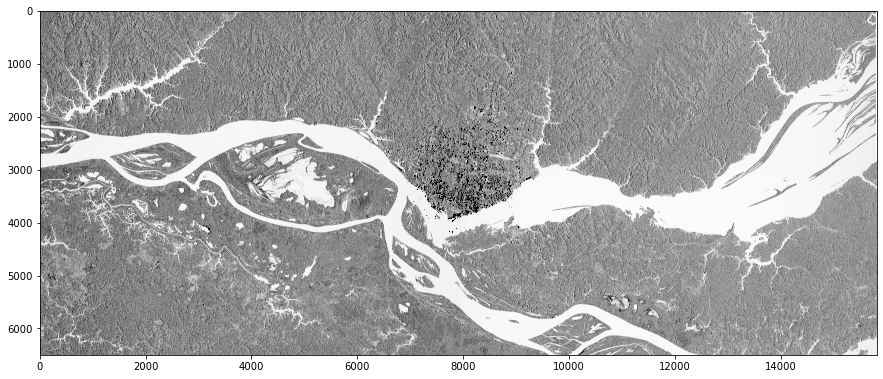

In [13]:
plotBand(S1A_Orb_Sub_Cal_Spk, 'Sigma0_VH', 0, 0.1)

### 4.5. Correção Geométrica

Esse processamento é feito pois, devido a variações topográficas da cena e ao fato de que o sensor capta imagens obliquamente à superfície, as distâncias medidas em relação à superfície podem ser distorcidas nas imagens. Além disso, a correção geométrica faz a correção da aparência invertida da imagem bruta.

In [14]:
parameters = HashMap()

parameters.put('sourceBands', 'Sigma0_VH')
parameters.put('demName', 'SRTM 3Sec')
parameters.put('pixelSpacingInMeter', 10.0)

S1A_Orb_Sub_Cal_Spk_Ter = GPF.createProduct('Terrain-Correction', parameters, S1A_Orb_Sub_Cal_Spk)

print('Correção Geométrica: 100%')

Correção Geométrica: 100%


In [15]:
# Informações do produto do processamento

band = S1A_Orb_Sub_Cal_Spk_Ter.getBand('Sigma0_VH')

width = band.getRasterWidth()
height = band.getRasterHeight()
name = band.getName()

print(f'Product: {name}')
print(f'Shape: {width} x {height} pixels')

Product: Sigma0_VH
Shape: 16858 x 9876 pixels


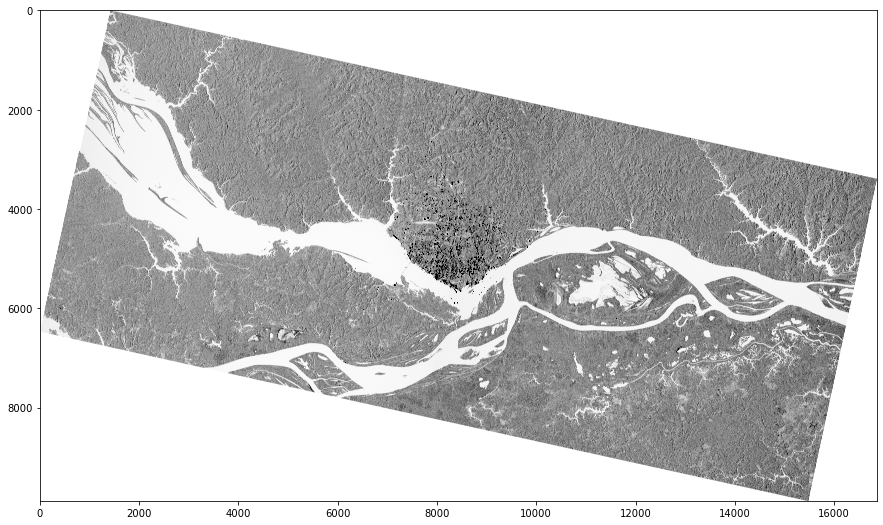

In [16]:
plotBand(S1A_Orb_Sub_Cal_Spk_Ter, 'Sigma0_VH', 0, 0.1)

### 4.6. Conversão para escala em decibéis

In [17]:
# LinearToFromdB

parameters = HashMap()

parameters.put('sourceBands', 'Sigma0_VH')

S1A_Orb_Sub_Cal_Spk_Ter_dB = GPF.createProduct('LinearToFromdB', parameters, S1A_Orb_Sub_Cal_Spk_Ter)

print("Conversão para dB: 100%")

Conversão para dB: 100%


In [18]:
band = S1A_Orb_Sub_Cal_Spk_Ter_dB.getBand('Sigma0_VH_db')

width = band.getRasterWidth()
height = band.getRasterHeight()
name = band.getName()

print(f'Product: {name}')
print(f'Shape: {width} x {height} pixels')

Product: Sigma0_VH_db
Shape: 16858 x 9876 pixels


## 5. Salvando a imagem

In [19]:
ProductIO.writeProduct(S1A_Orb_Sub_Cal_Spk_Ter_dB, 'C:/Users/jales/Desktop/S1/20122018', 'ENVI')

print("Imagem salva com sucesso!")

Imagem salva com sucesso!


## 6. Conclusões

Nesse projeto executei uma série de processamentos em uma imagem do satélite Sentinel-1 em uma rotina automatizada.

A principal vantagem de utilizar um script como esse é ganhar mais agilidade no processamento de dados de sensoriamento remoto. Outra grande vantagem é poder incluir esses processamentos em sistemas automatizados, como por exemplo o monitoramento de riscos de cheias em áreas ribeirinhas.

Uma das dificuldades que tive nesse estudo foi a questão da limitação de hardware. O fato de possuir um poder de processamento mediano pra atualidade, limitou bastante a quantidade de dados processados. 